In [1]:
import sys
sys.path.append('../')

import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

from helpers.cm26 import DatasetCM26
from helpers.selectors import select_NA, select_Pacific, select_Cem, select_globe, compare, plot
from helpers.operators import Coarsen, Filtering, Subsampling, CoarsenKochkov, CoarsenWeighted

import hvplot.xarray
import hvplot
import cmocean

%load_ext autoreload
%autoreload 3

In [2]:
%time ds = DatasetCM26()

CPU times: user 2.58 s, sys: 707 ms, total: 3.28 s
Wall time: 12.6 s


# Comparing to LEAP branch

In [3]:
SGS = ds.compute_subgrid_forcing(percentile=0, coarsening=Coarsen(), factor=4)
data = SGS.data.isel(time=7)

In [4]:
data_ctrl = xr.open_dataset('../leap-test/factor-4-coarsen-data.nc')
param_ctrl = xr.open_dataset('../leap-test/factor-4-param.nc')
for key in ['xq', 'yq', 'xh', 'yh']:
    data_ctrl[key] = data[key]
    param_ctrl[key] = data[key]

Correlation: 0.9999414002779908
Relative Error: 0.002048022812232375
R2 =  0.999881903968344
R2 max =  0.9998822528214077
Optinal scaling: 0.999409556388855
Nans [test/control]: [0, 0]


Correlation: 0.9998957810090358
Relative Error: 0.0026946438010782003
R2 =  0.999791818583617
R2 max =  0.9997929658566136
Optinal scaling: 0.9989300966262817
Nans [test/control]: [0, 0]


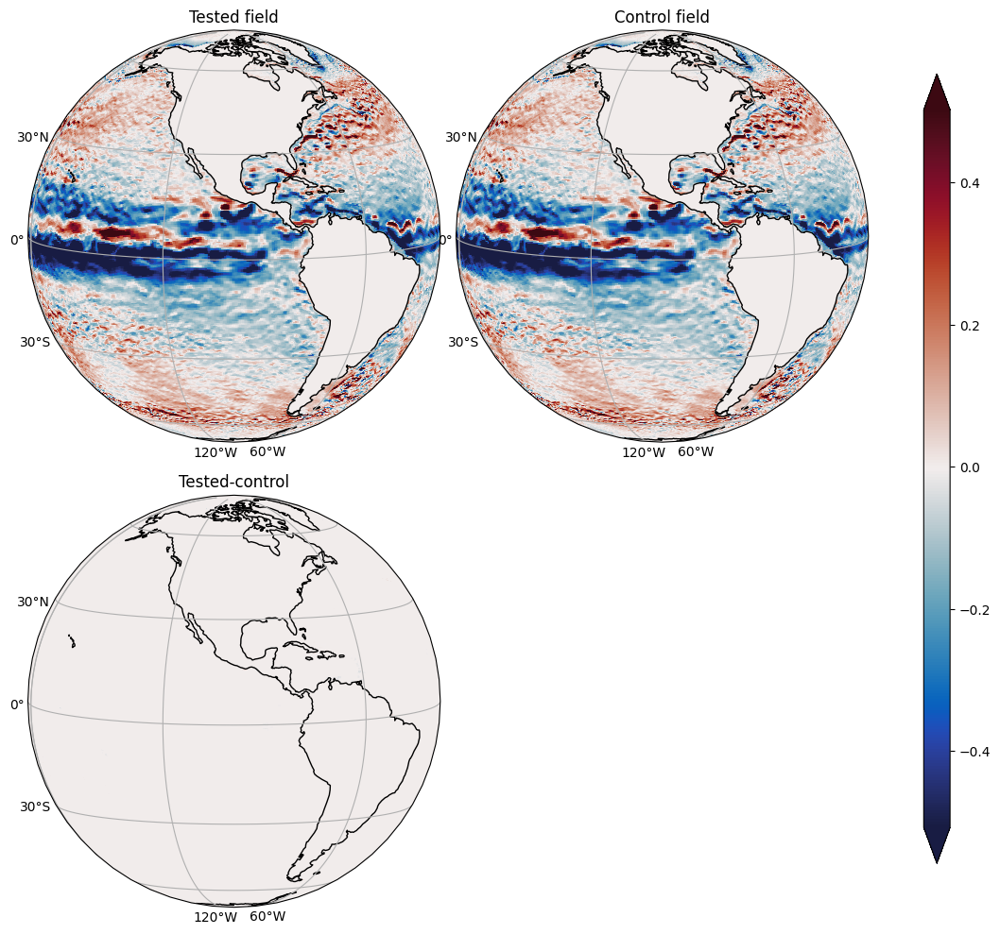

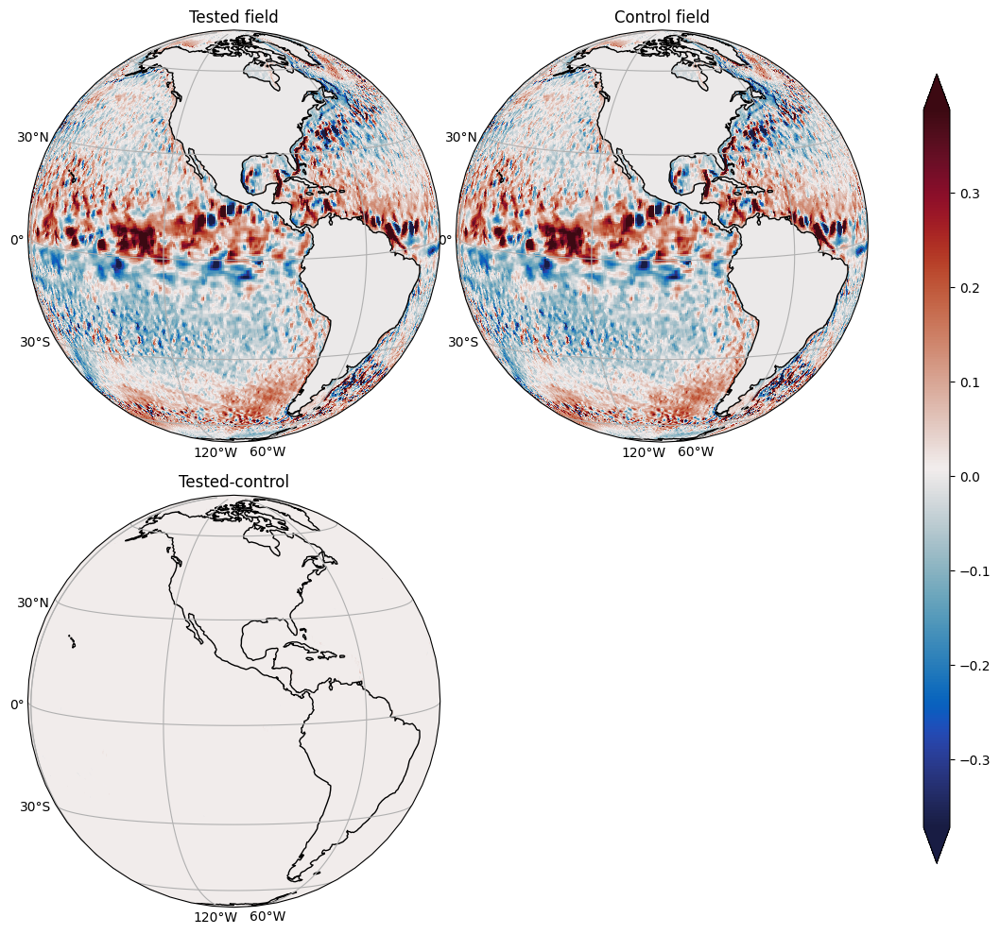

In [5]:
compare(data.u, data_ctrl.u, selector=select_globe)
print('\n')
compare(data.v, data_ctrl.v, selector=select_globe)

Correlation: 0.9987789955644458
Relative Error: 0.012215872526993394
R2 =  0.9975590294554124
R2 max =  0.9975592530965892
Optinal scaling: 1.0004737096310923
Nans [test/control]: [0, 0]


Correlation: 0.9985844727526756
Relative Error: 0.012008566688680137
R2 =  0.9971684147941531
R2 max =  0.9971710662893954
Optinal scaling: 1.0016333127483925
Nans [test/control]: [0, 0]


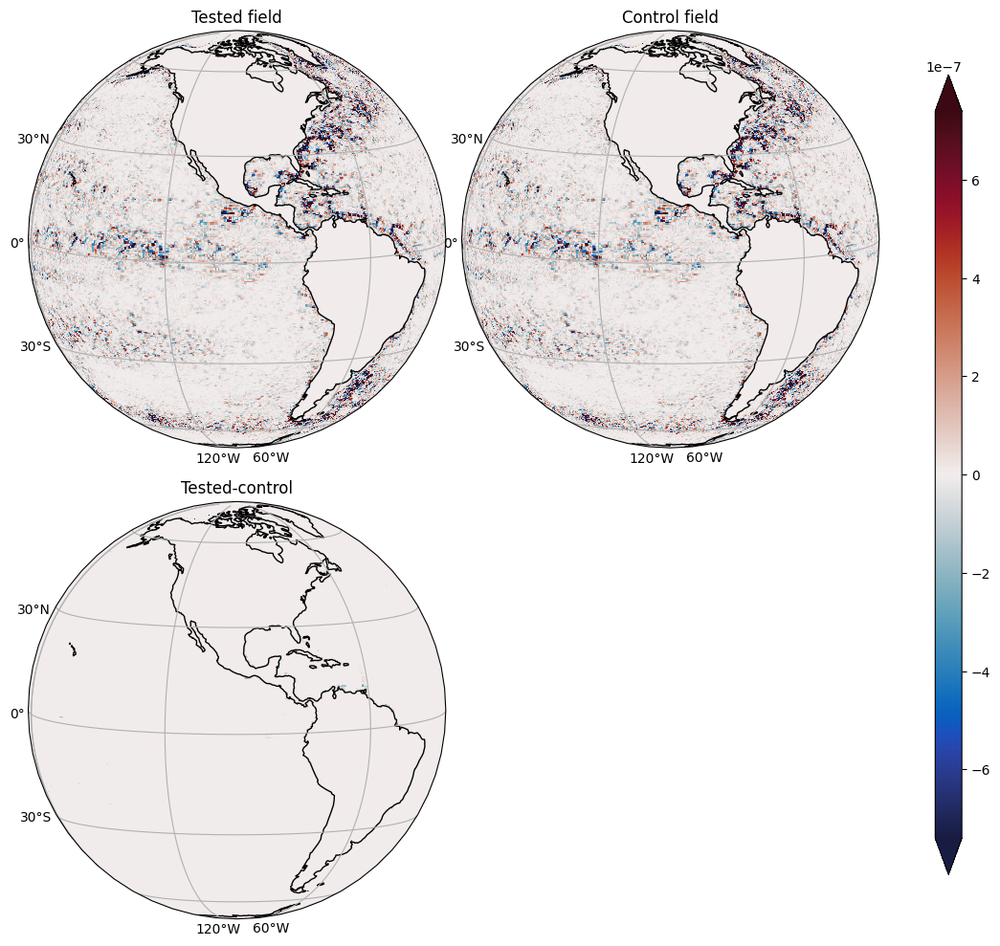

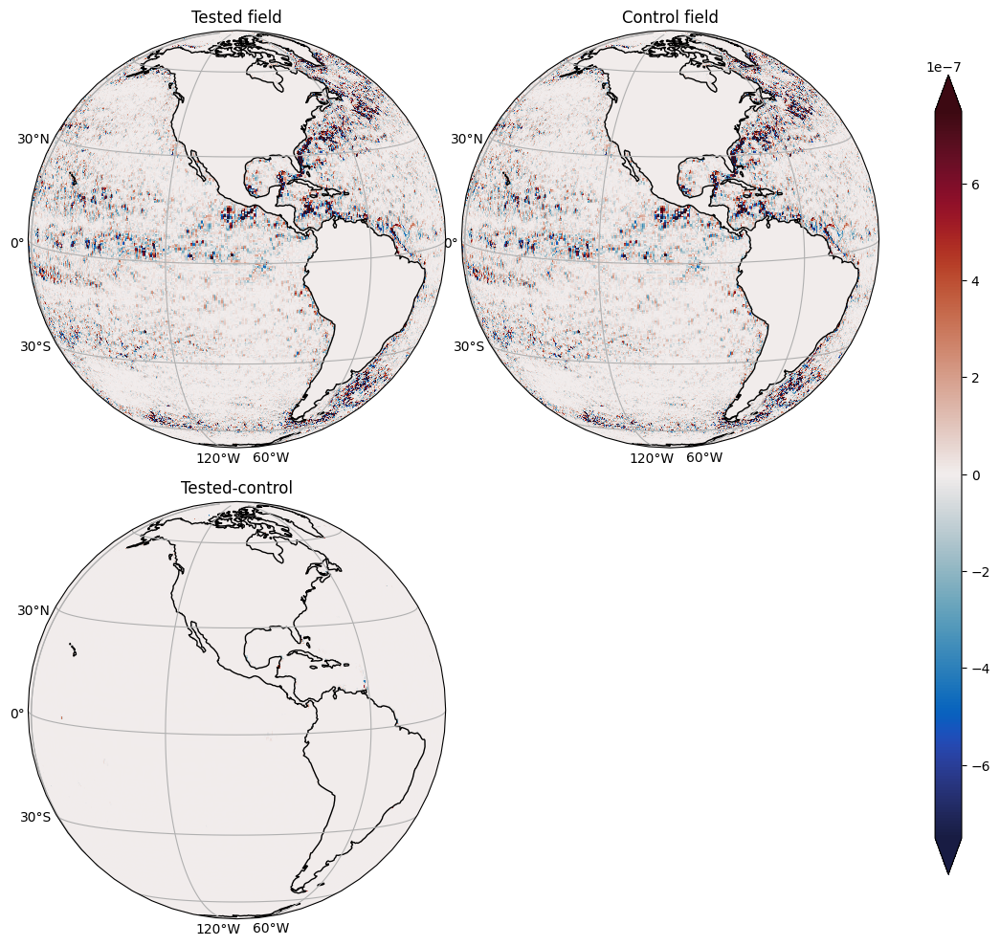

In [6]:
compare(data.SGSx, data_ctrl.SGSx, selector=select_globe)
print('\n')
compare(data.SGSy, data_ctrl.SGSy, selector=select_globe)

# Gaussian filter

In [8]:
SGS = ds.compute_subgrid_forcing(percentile=0, coarsening=Subsampling(), filtering=Filtering(), FGR_multiplier=2, factor=4)
data_gauss = SGS.data.isel(time=7)

In [9]:
data_ctrl = xr.open_dataset('../leap-test/factor-4-gauss-data.nc')
param_ctrl = xr.open_dataset('../leap-test/factor-4-param.nc')
for key in ['xq', 'yq', 'xh', 'yh']:
    data_ctrl[key] = data[key]
    param_ctrl[key] = data[key]

Correlation: 0.9999339887908225
Relative Error: 0.0032153945888598982
R2 =  0.9998673178551808
R2 max =  0.9998680320407175
Optinal scaling: 0.999155562921608
Nans [test/control]: [0, 0]


Correlation: 0.999873409196662
Relative Error: 0.003952783813940717
R2 =  0.9997455251563667
R2 max =  0.9997484746375984
Optinal scaling: 0.9982853237605391
Nans [test/control]: [0, 0]


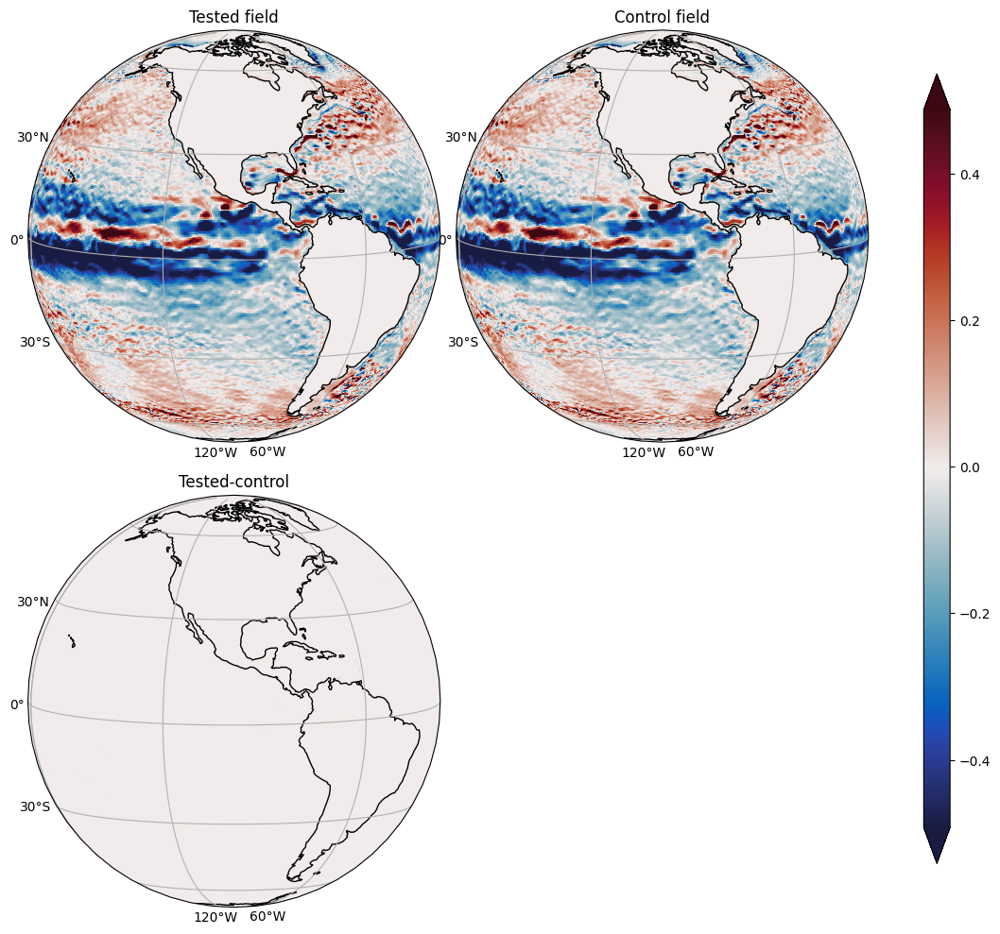

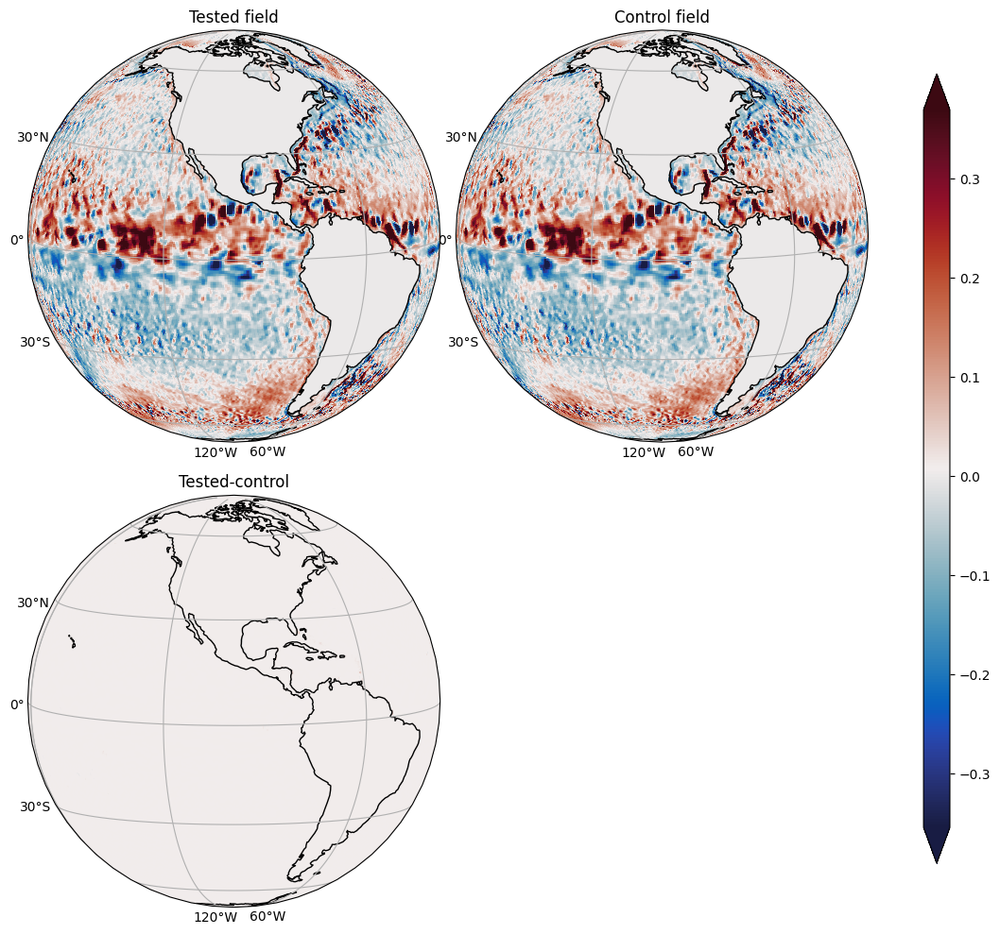

In [10]:
compare(data_gauss.u, data_ctrl.u, selector=select_globe)
print('\n')
compare(data_gauss.v, data_ctrl.v, selector=select_globe)

Correlation: 0.9979437481437207
Relative Error: 0.01936050736541415
R2 =  0.9958822266494782
R2 max =  0.99589135630132
Optinal scaling: 0.9969813818798223
Nans [test/control]: [0, 0]


Correlation: 0.9978101836105407
Relative Error: 0.0194111213157062
R2 =  0.9956137185975119
R2 max =  0.9956254817906133
Optinal scaling: 0.9965744967767003
Nans [test/control]: [0, 0]


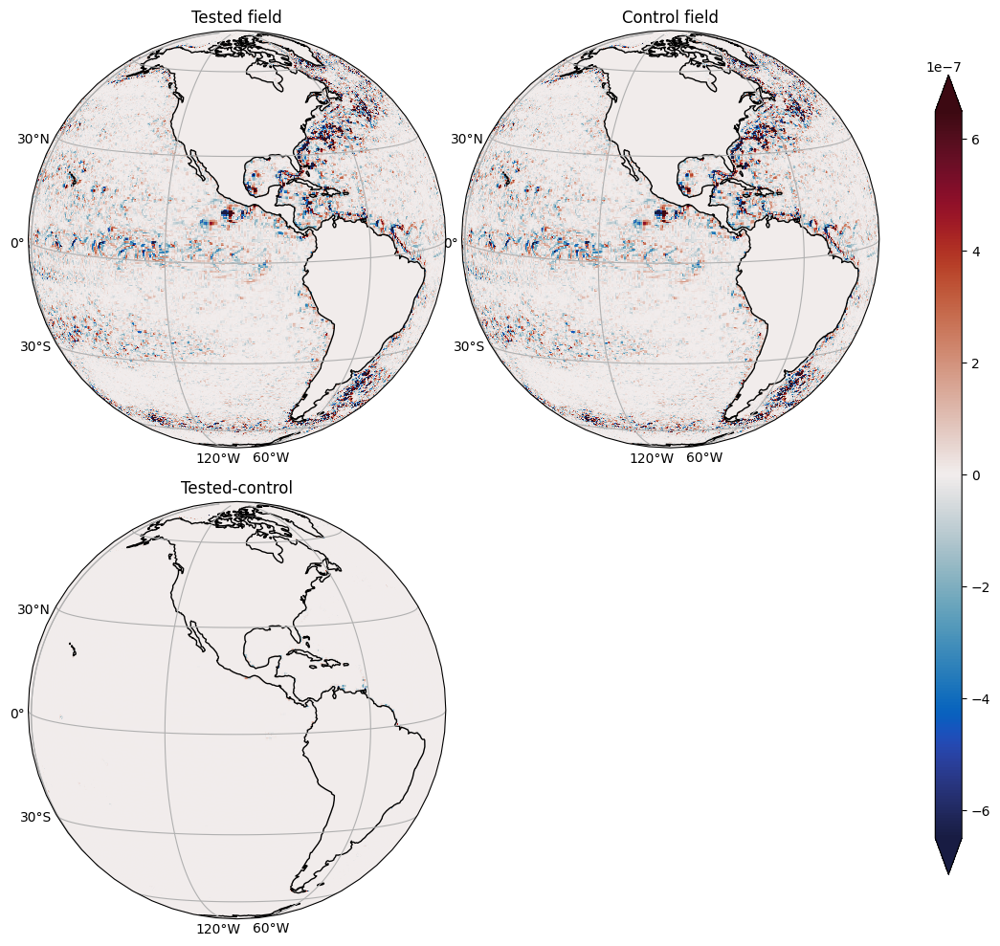

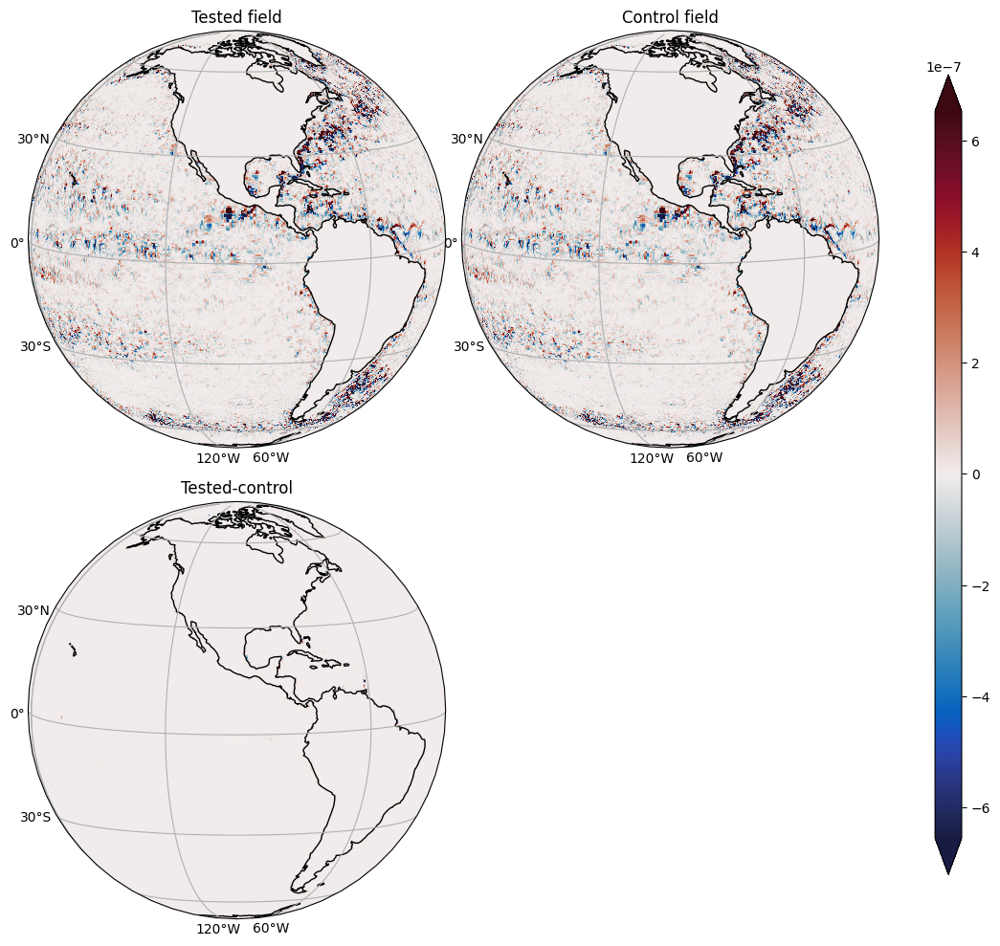

In [11]:
compare(data_gauss.SGSx, data_ctrl.SGSx, selector=select_globe)
print('\n')
compare(data_gauss.SGSy, data_ctrl.SGSy, selector=select_globe)

# 2D versus 3D datasets

In [12]:
surface = DatasetCM26()
ocean = DatasetCM26(source='cmip6-3d')

In [13]:
SGS = surface.compute_subgrid_forcing(factor=4, filtering=Filtering(), coarsening=CoarsenKochkov(), FGR_multiplier=2)

In [14]:
SGS_3d = ocean.compute_subgrid_forcing(factor=4, filtering=Filtering(), coarsening=CoarsenKochkov(), FGR_multiplier=2)

In [15]:
oce = SGS_3d.split(zl=0).data
surf = SGS.data.sel(time=oce.time)

Correlation: 0.9728480945152728
Relative Error: 0.2644307568918034
R2 =  0.9464101135328652
R2 max =  0.9464205854391147
Optinal scaling: 1.0033374734281146
Nans [test/control]: [0, 0]


Correlation: 0.9499693604726911
Relative Error: 0.34039558725551
R2 =  0.9012156901157299
R2 max =  0.9023520807300108
Optinal scaling: 1.0367932339007224
Nans [test/control]: [0, 0]


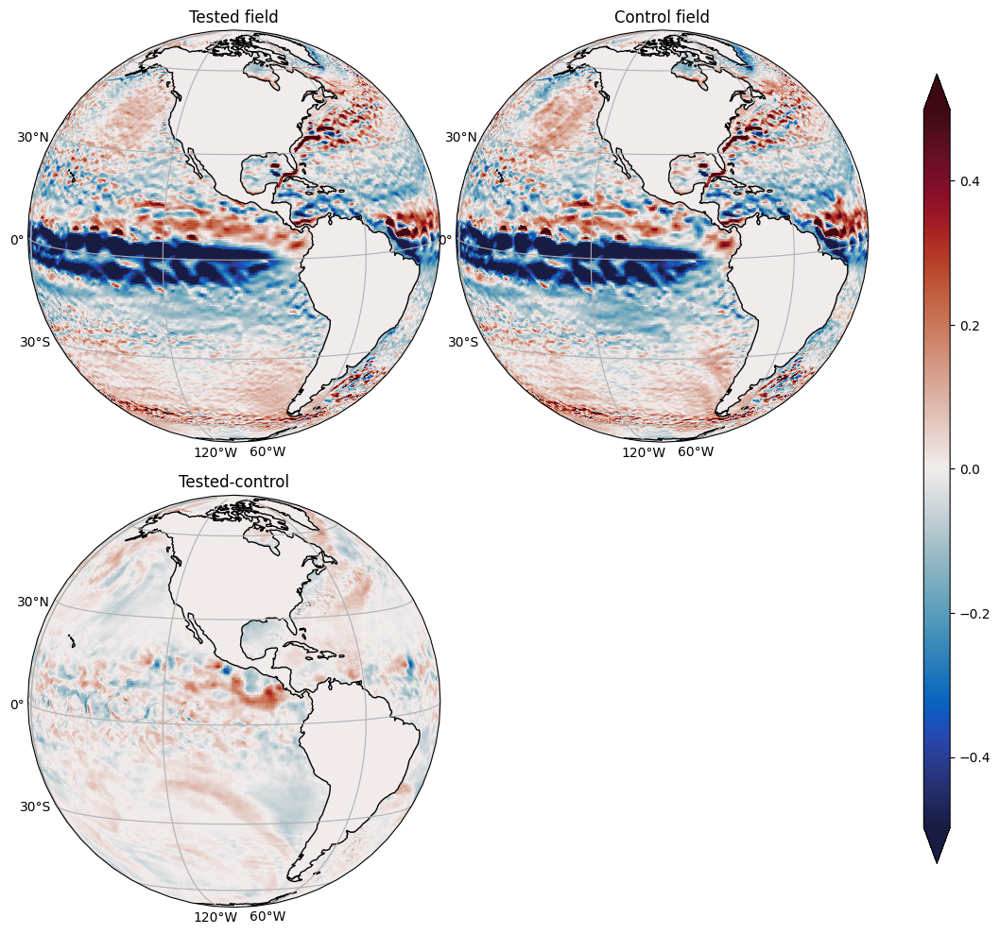

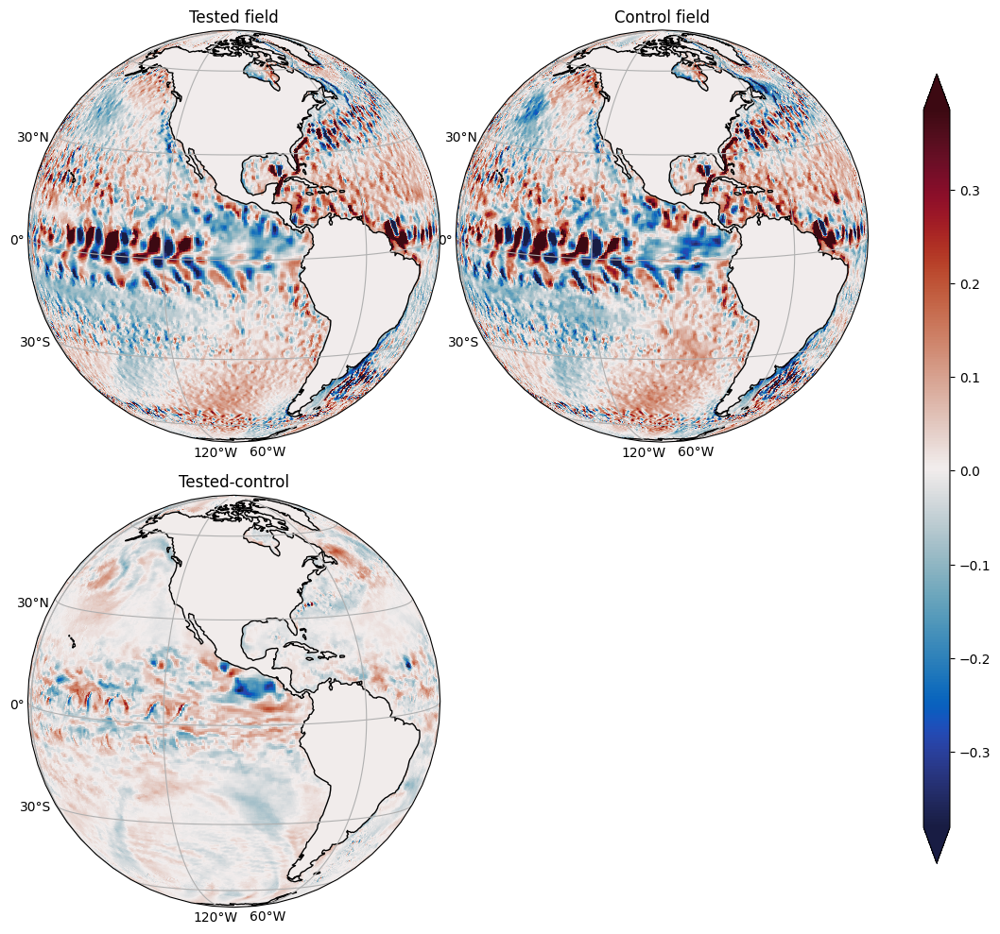

In [16]:
compare(oce.u, surf.u, selector=select_globe)
print('\n')
compare(oce.v, surf.v, selector=select_globe)

Correlation: 0.8655951280804536
Relative Error: 0.40209530936760884
R2 =  0.737217257622863
R2 max =  0.7492485906793442
Optinal scaling: 1.1451076172815828
Nans [test/control]: [0, 0]


Correlation: 0.8739248873978225
Relative Error: 0.3942281476273308
R2 =  0.7537504208964183
R2 max =  0.7637472635017751
Optinal scaling: 1.129188226057538
Nans [test/control]: [0, 0]


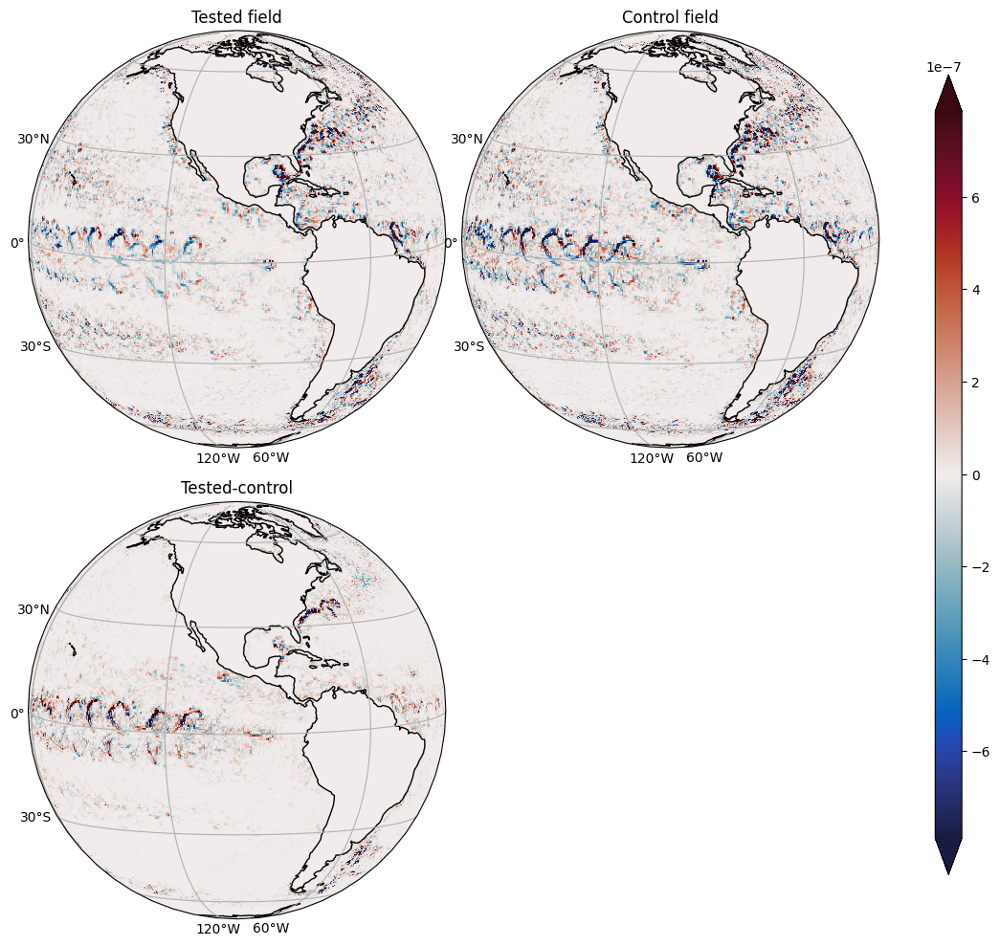

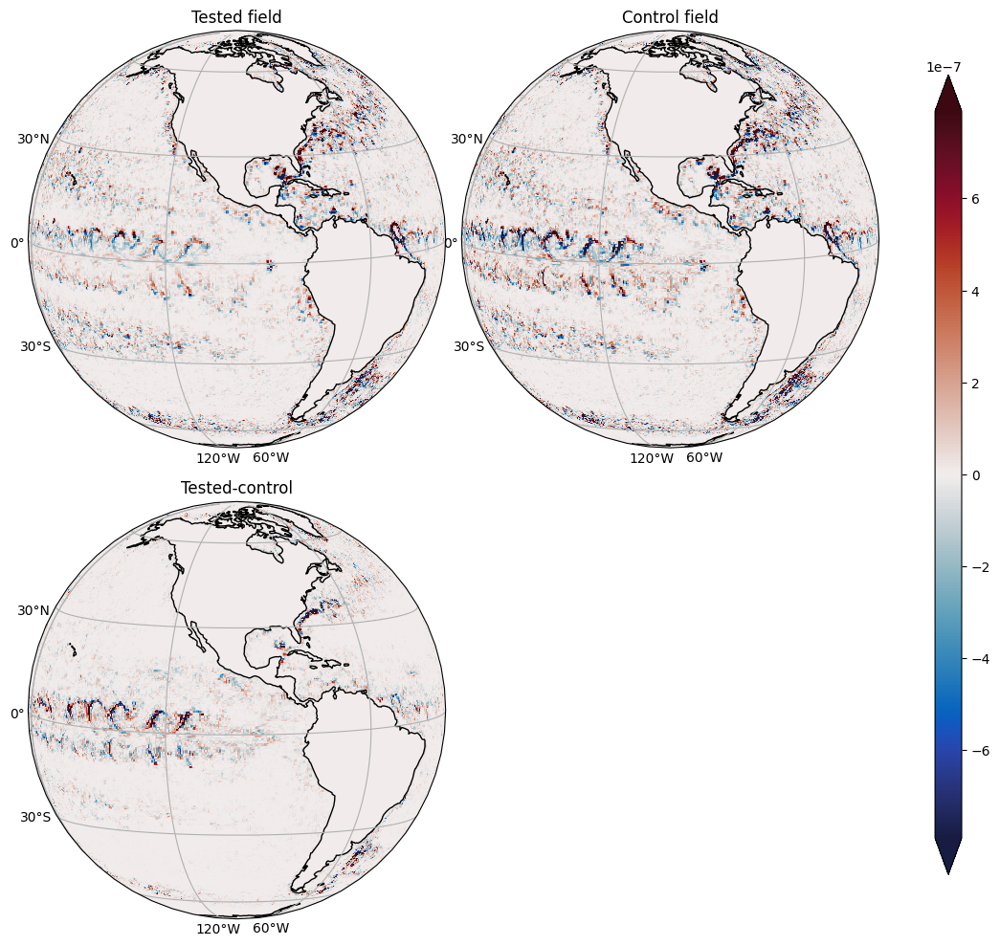

In [17]:
compare(oce.SGSx, surf.SGSx, selector=select_globe)
print('\n')
compare(oce.SGSy, surf.SGSy, selector=select_globe)

In [18]:
%time SGS_3d.data.SGSx.isel(zl=1,time=-1).compute();
%time SGS_3d.data.SGSx.isel(zl=slice(0,14),time=-1).compute();
%time SGS_3d.data.SGSx.isel(zl=0,time=slice(0,14)).compute();

CPU times: user 14.3 s, sys: 6.96 s, total: 21.2 s
Wall time: 12.3 s
CPU times: user 1min 54s, sys: 1min 8s, total: 3min 2s
Wall time: 35.9 s
CPU times: user 1min 51s, sys: 1min 5s, total: 2min 56s
Wall time: 35 s


# Subfilter versus subgrid

In [19]:
surface = DatasetCM26()

# FGR=4

In [23]:
%time SGS = surface.compute_subgrid_forcing(filtering=Filtering(), coarsening=CoarsenKochkov(), factor=4, FGR_multiplier=4)

CPU times: user 11.6 s, sys: 2.14 s, total: 13.8 s
Wall time: 11.3 s


In [24]:
SFS = surface.compute_subfilter_forcing(filtering=Filtering(), coarsening=CoarsenKochkov(), factor=4, FGR_multiplier=4)

Correlation: 1.0
Relative Error: 0.0
R2 =  1.0
R2 max =  1.0
Optinal scaling: 1.0
Nans [test/control]: [0, 0]
Correlation: 1.0
Relative Error: 0.0
R2 =  1.0
R2 max =  1.0
Optinal scaling: 1.0
Nans [test/control]: [0, 0]


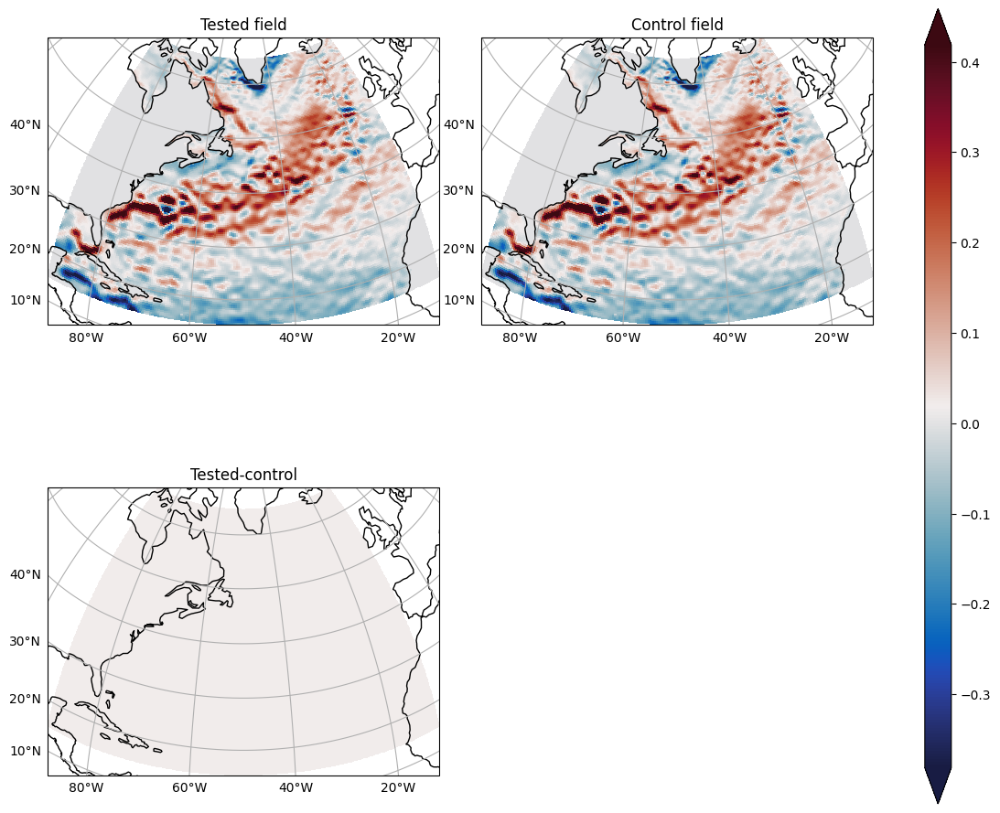

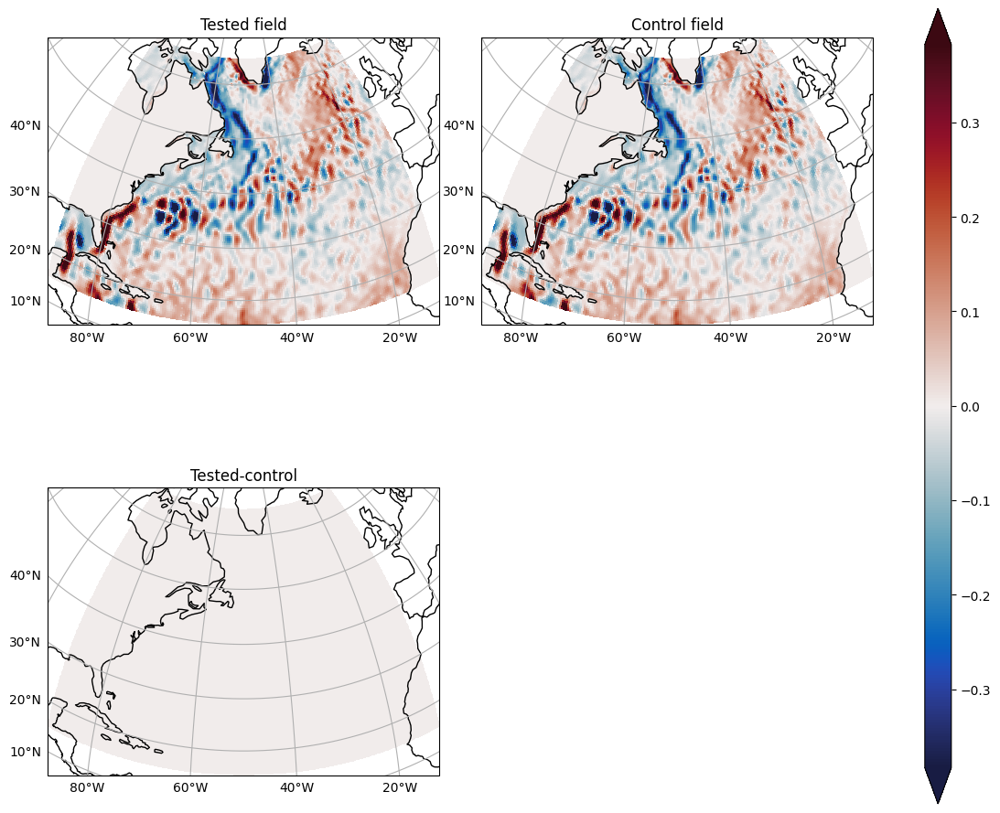

In [25]:
compare(SFS.data.u,SGS.data.u)
compare(SFS.data.v,SGS.data.v)

Correlation: 0.9718951023405451
Relative Error: 0.1842332067565566
R2 =  0.944554832661845
R2 max =  0.9445653306694619
Optinal scaling: 1.003344935162315
Nans [test/control]: [0, 0]
Correlation: 0.9379730652465148
Relative Error: 0.22356162351294717
R2 =  0.8789589924895417
R2 max =  0.8799271881263795
Optinal scaling: 0.9678940151344888
Nans [test/control]: [0, 0]


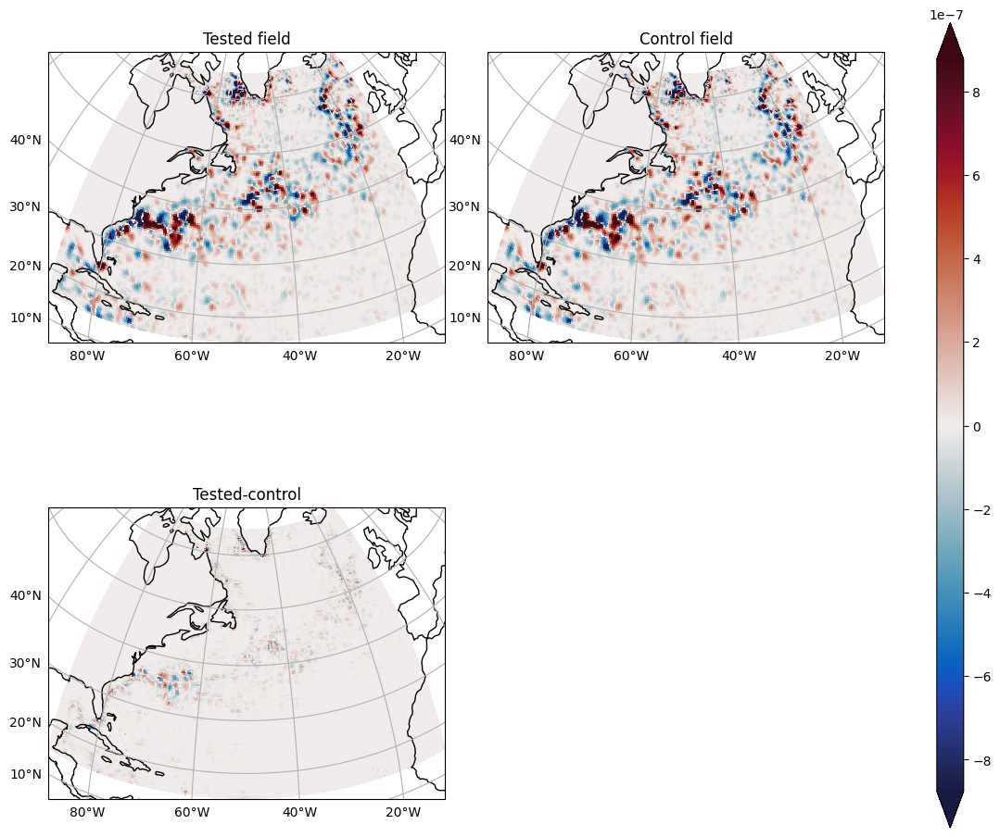

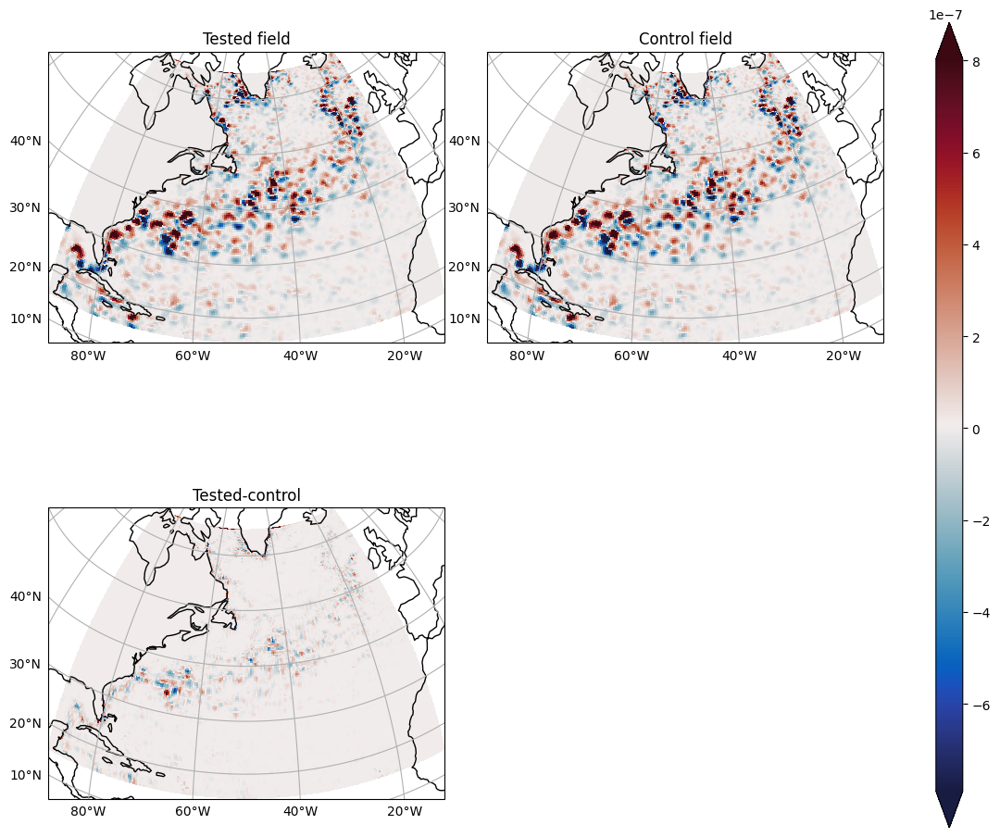

In [26]:
compare(SFS.data.SGSx,SGS.data.SGSx)
compare(SFS.data.SGSy,SGS.data.SGSy)

# FRG=1

In [27]:
%time SGS = surface.compute_subgrid_forcing(filtering=Filtering(), coarsening=CoarsenKochkov(), factor=4, FGR_multiplier=1)
%time SFS = surface.compute_subfilter_forcing(filtering=Filtering(), coarsening=CoarsenKochkov(), factor=4, FGR_multiplier=1)

CPU times: user 11.3 s, sys: 727 ms, total: 12.1 s
Wall time: 11.2 s
CPU times: user 11.2 s, sys: 419 ms, total: 11.6 s
Wall time: 10.8 s


Correlation: 1.0
Relative Error: 0.0
R2 =  1.0
R2 max =  1.0
Optinal scaling: 1.0
Nans [test/control]: [0, 0]
Correlation: 1.0
Relative Error: 0.0
R2 =  1.0
R2 max =  1.0
Optinal scaling: 1.0
Nans [test/control]: [0, 0]


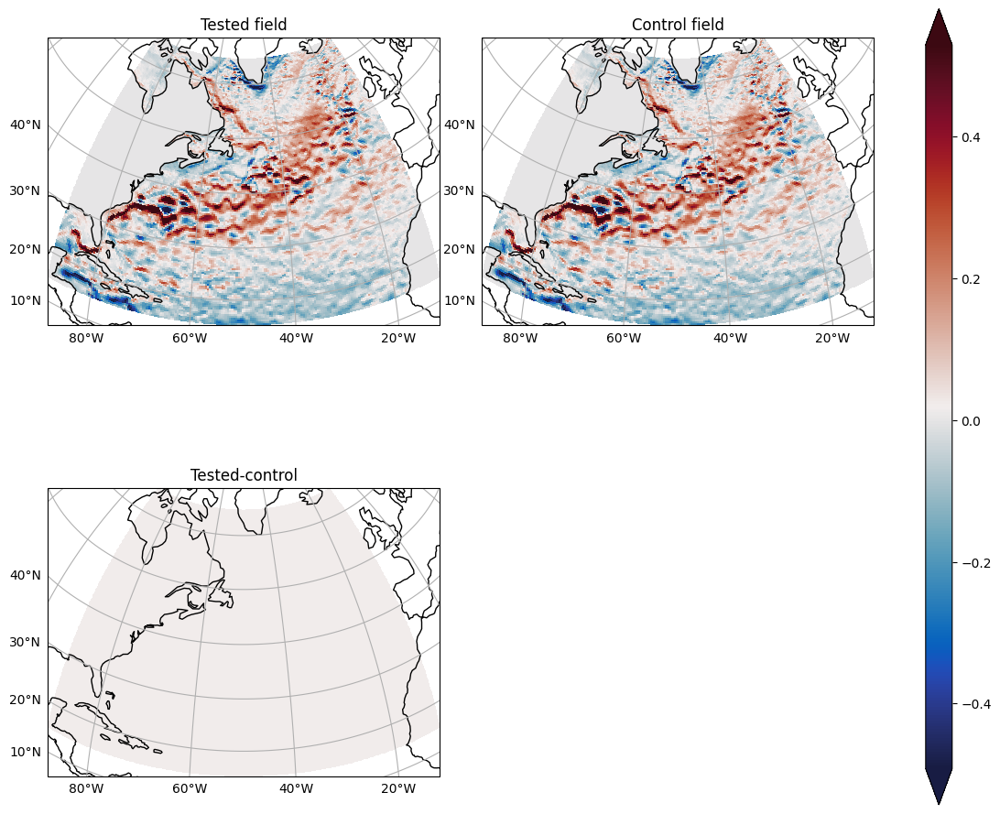

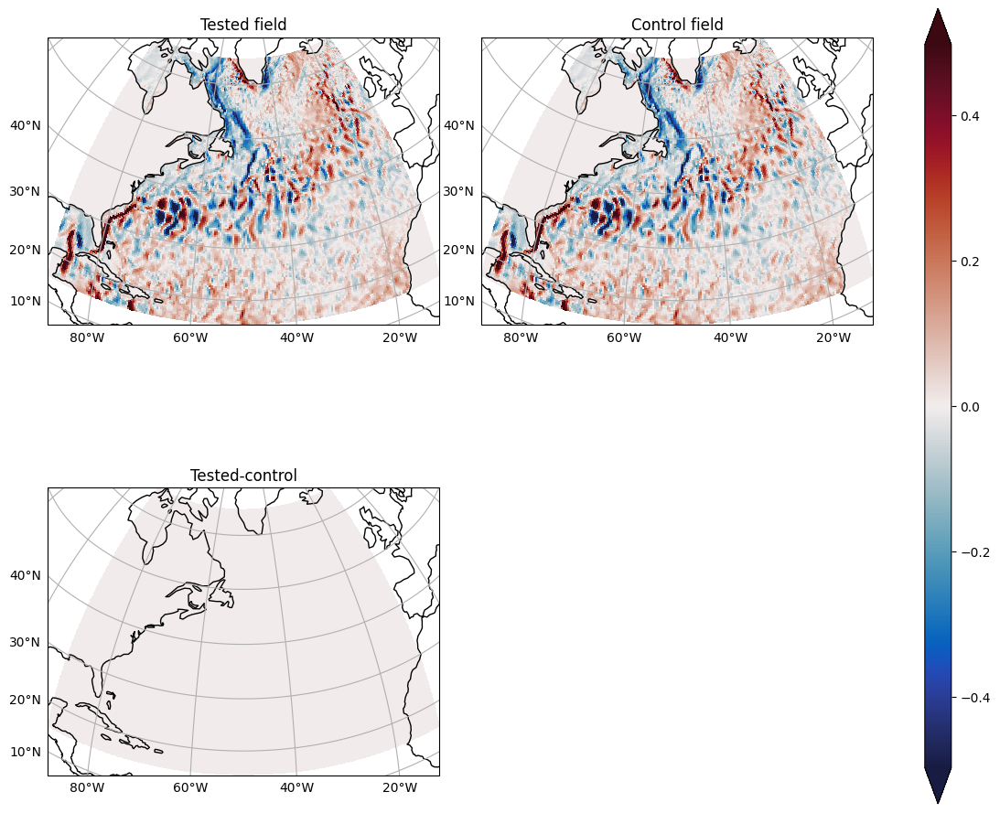

In [28]:
compare(SFS.data.u,SGS.data.u)
compare(SFS.data.v,SGS.data.v)

Correlation: 0.5887540432396703
Relative Error: 0.8749698208121273
R2 =  0.24537567962856222
R2 max =  0.34663337281787154
Optinal scaling: 2.176179130581894
Nans [test/control]: [0, 0]
Correlation: 0.5768074412083499
Relative Error: 0.8890755333549595
R2 =  0.2479772895929615
R2 max =  0.33269627810963565
Optinal scaling: 2.0186615830996555
Nans [test/control]: [0, 0]


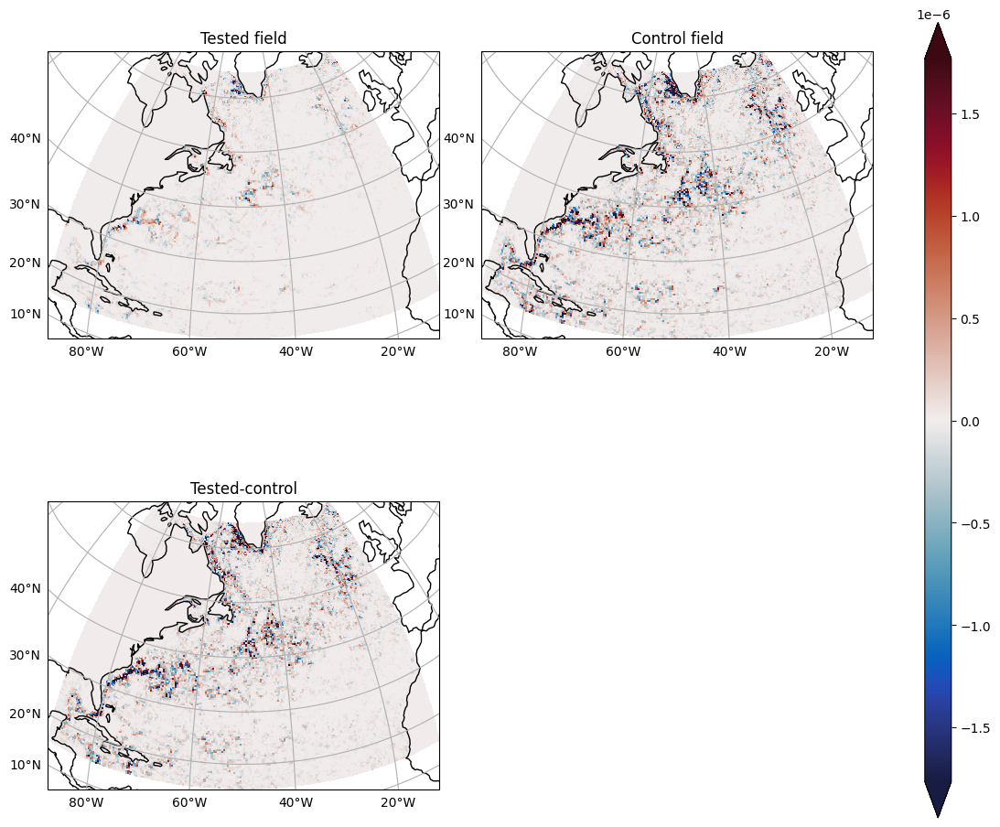

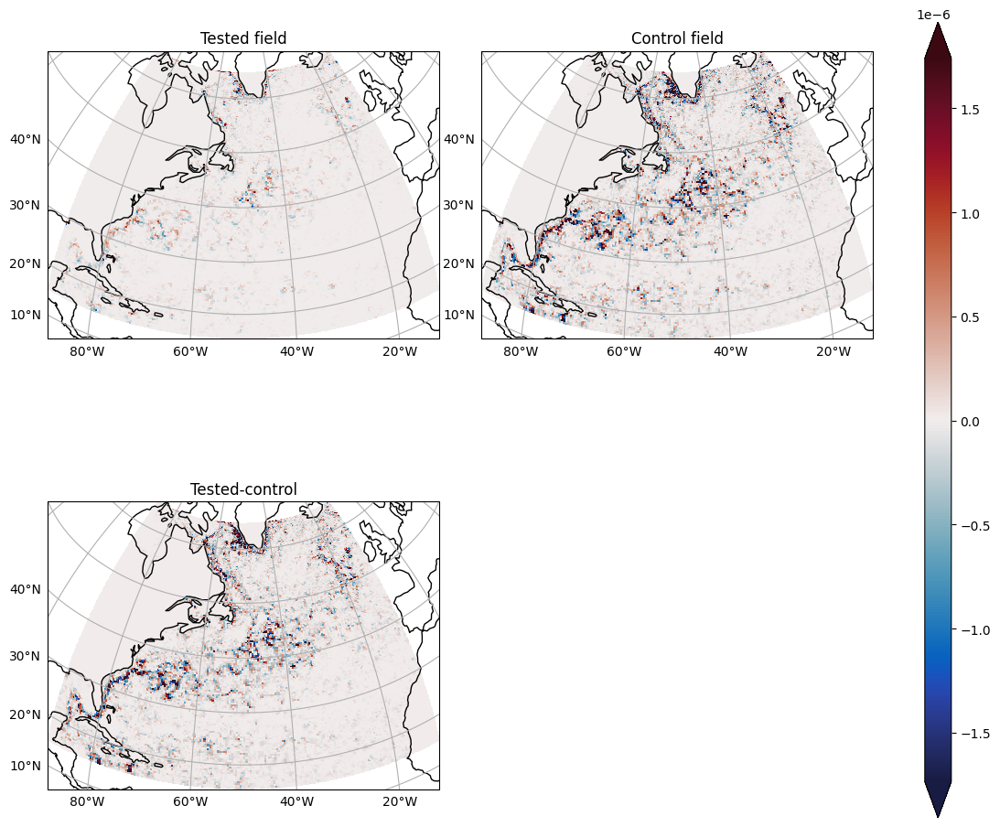

In [29]:
compare(SFS.data.SGSx,SGS.data.SGSx)
compare(SFS.data.SGSy,SGS.data.SGSy)

# FGR = 2

In [30]:
%time SGS = surface.compute_subgrid_forcing(filtering=Filtering(), coarsening=CoarsenKochkov(), factor=4, FGR_multiplier=2)
%time SFS = surface.compute_subfilter_forcing(filtering=Filtering(), coarsening=CoarsenKochkov(), factor=4, FGR_multiplier=2)

CPU times: user 6.26 s, sys: 783 ms, total: 7.05 s
Wall time: 5.55 s
CPU times: user 11.7 s, sys: 1.19 s, total: 12.9 s
Wall time: 11.4 s


Correlation: 0.8540319003395601
Relative Error: 0.5578500126913727
R2 =  0.699678594554317
R2 max =  0.7293705659171105
Optinal scaling: 1.2527635955217986
Nans [test/control]: [0, 0]
Correlation: 0.8204313627739731
Relative Error: 0.5948876195510091
R2 =  0.6531718251304626
R2 max =  0.6731586099005722
Optinal scaling: 1.208183129389723
Nans [test/control]: [0, 0]


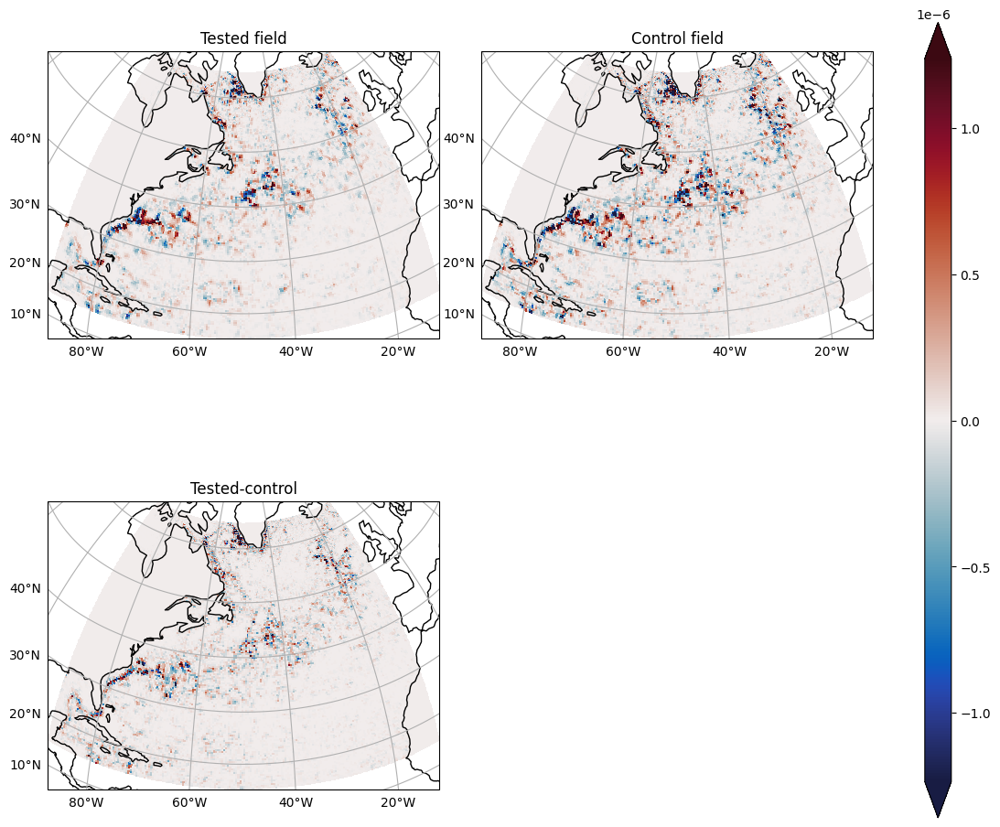

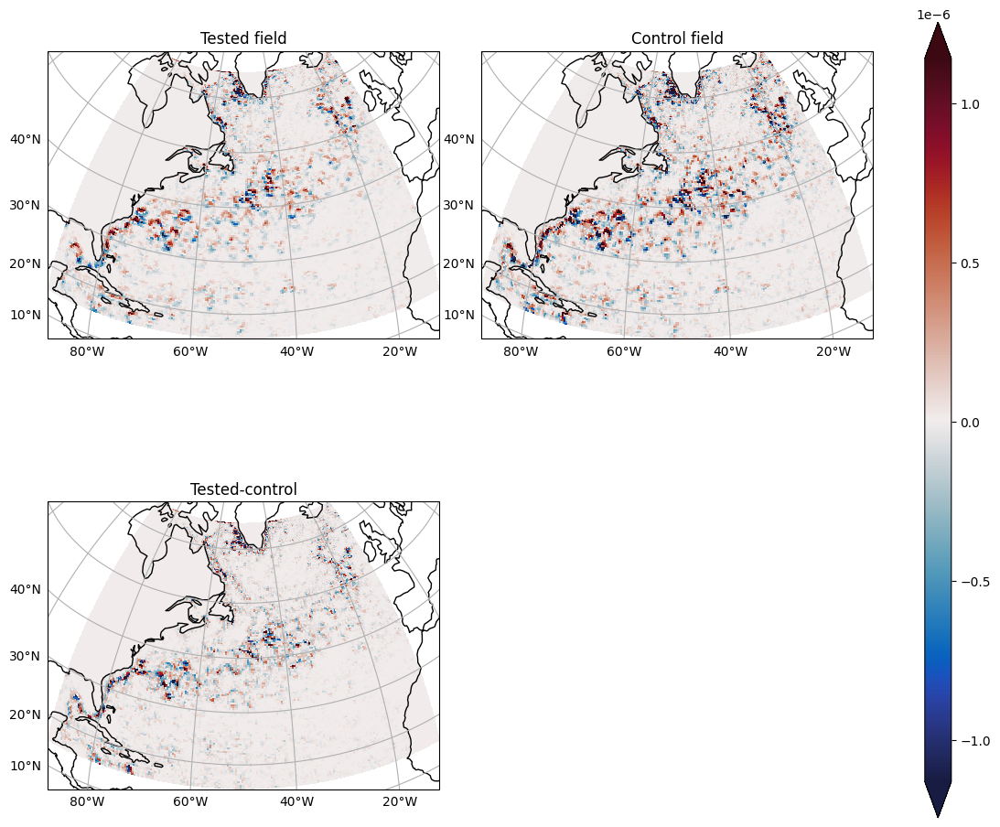

In [31]:
compare(SFS.data.SGSx,SGS.data.SGSx)
compare(SFS.data.SGSy,SGS.data.SGSy)